In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/animefacedataset/images/35715_2011.jpg
/kaggle/input/animefacedataset/images/48610_2014.jpg
/kaggle/input/animefacedataset/images/34719_2011.jpg
/kaggle/input/animefacedataset/images/40266_2012.jpg
/kaggle/input/animefacedataset/images/4199_2002.jpg
/kaggle/input/animefacedataset/images/40739_2013.jpg
/kaggle/input/animefacedataset/images/42515_2013.jpg
/kaggle/input/animefacedataset/images/52482_2015.jpg
/kaggle/input/animefacedataset/images/46555_2014.jpg
/kaggle/input/animefacedataset/images/11579_2005.jpg
/kaggle/input/animefacedataset/images/36943_2012.jpg
/kaggle/input/animefacedataset/images/9787_2004.jpg
/kaggle/input/animefacedataset/images/3388_2002.jpg
/kaggle/input/animefacedataset/images/8393_2004.jpg
/kaggle/input/animefacedataset/images/30352_2010.jpg
/kaggle/input/animefacedataset/images/10908_2005.jpg
/kaggle/input/animefacedataset/images/22363_2008.jpg
/kaggle/input/animefacedataset/images/51151_2015.jpg
/kaggle/input/animefacedataset/images/59491_2018.j

In [43]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as T
from torch.utils.tensorboard import SummaryWriter

In [44]:
import os
data_dir = "/kaggle/input/animefacedataset"
print(os.listdir(data_dir))

['images']


In [45]:
print(os.listdir(data_dir + '/images')[:10])

['35715_2011.jpg', '48610_2014.jpg', '34719_2011.jpg', '40266_2012.jpg', '4199_2002.jpg', '40739_2013.jpg', '42515_2013.jpg', '52482_2015.jpg', '46555_2014.jpg', '11579_2005.jpg']


In [46]:
from torchvision.datasets import ImageFolder
image_size = 64
batch_size = 128
stats = (0.5,0.5,0.5),(0.5,0.5,0.5)



In [47]:
train_ds = ImageFolder(data_dir , transform = T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)
]))

train_dl = DataLoader(train_ds,
                     batch_size,
                     shuffle = True,
                     num_workers = 0,
                     pin_memory = True)

In [48]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline



In [49]:
def denorm(img_tensors):
    return img_tensors* stats[1][0] + stats[0][0]


In [50]:
def show_images(images, nmax =64):
    fig , ax = plt.subplots(figsize=(8,8))
    ax.set_xticks([]);ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]),nrow = 8).permute(1,2,0))

def show_batch(dl , nmax = 64):
    for images, _ in dl:
        show_images(images , nmax)
        break

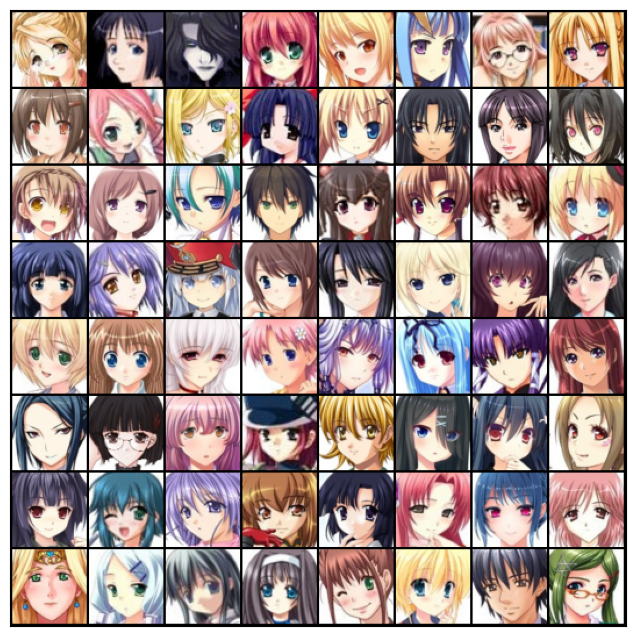

In [51]:
show_batch(train_dl)

In [71]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataloader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
    
    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)
            
    def __len__(self):
        return len(self.dl)

In [72]:
device = get_default_device()
device

device(type='cuda')

In [73]:
train_dl  = DeviceDataloader(train_dl,device)

In [121]:
discriminator = nn.Sequential(
nn.Conv2d(3, 64, kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.BatchNorm2d(64),
nn.LeakyReLU(0.2 , inplace = True),

nn.Conv2d(64, 128, kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.BatchNorm2d(128),
nn.LeakyReLU(0.2 , inplace = True),

nn.Conv2d(128, 256, kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.BatchNorm2d(256),
nn.LeakyReLU(0.2 , inplace = True),

nn.Conv2d(256,512 , kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.BatchNorm2d(512),
nn.LeakyReLU(0.2 , inplace = True),

nn.Conv2d(512,1 , kernel_size=4 ,stride = 1, padding = 0, bias = False),

nn.Flatten(),
nn.Sigmoid())

In [116]:
latent_size = 128
generator = nn.Sequential(
nn.ConvTranspose2d(latent_size,512, kernel_size=4 ,stride = 2, padding = 0, bias = False),
nn.BatchNorm2d(512),
nn.ReLU(True),

nn.ConvTranspose2d(512,256, kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.BatchNorm2d(256),
nn.ReLU(True),

nn.ConvTranspose2d(256,128, kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.BatchNorm2d(128),
nn.ReLU(True),

nn.ConvTranspose2d(128,64, kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.BatchNorm2d(64),
nn.ReLU(True),

nn.ConvTranspose2d(64, 3, kernel_size=4 ,stride = 2, padding = 1, bias = False),
nn.Tanh(),
)

torch.Size([128, 128, 1, 1])
torch.Size([128, 3, 64, 64])


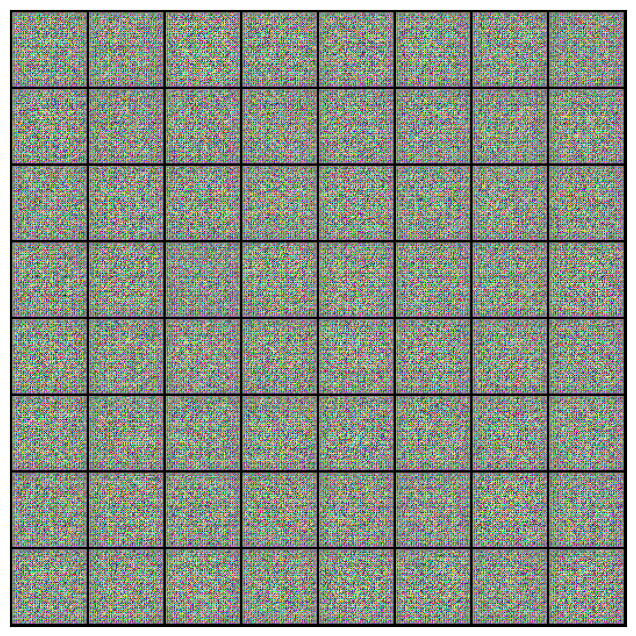

In [100]:
xb = torch.randn(batch_size , latent_size , 1,1)
print(xb.shape)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [102]:
def train_discriminator(real_images , opt_d):
    opt_d.zero_grad()
    
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0),1, device = device)
    real_loss = F.binary_cross_entropy(real_preds , real_targets)
    real_score = torch.mean(real_preds).item()
    
    latent = torch.randn(batch_size, latent_size , 1,1, device = device )
    fake_images = generator(latent)
    
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds , fake_targets)
    fake_score = torch.mean(fake_preds).item()
    
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item() , real_score , fake_score

In [125]:
def train_generator(opt_g):
    opt_g.zero_grad()
    
    latent = torch.randn(batch_size, latent_size , 1,1, device = device )
    fake_images = generator(latent)
    
    preds = discriminator(fake_images)
    targets = torch.ones(latent.size(0),1, device = device)
    loss = F.binary_cross_entropy(preds , targets)
    
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [104]:
from torchvision.utils import save_image

In [106]:
generator = generator.to(device)
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [107]:
device = get_default_device()
device

device(type='cuda')

In [108]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [109]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

Saving generated-images-0000.png


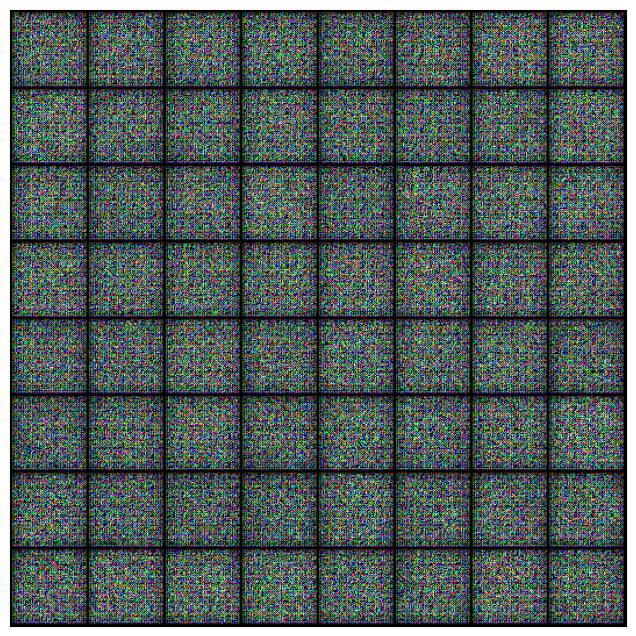

In [110]:
save_samples(0, fixed_latent)

In [111]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [123]:
generator = generator.to(device)
discriminator = discriminator.to(device)
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [119]:
lr = 0.0002
epochs = 25

In [126]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 4.1398, loss_d: 0.4213, real_score: 0.7374, fake_score: 0.0402
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 3.4158, loss_d: 0.4484, real_score: 0.7216, fake_score: 0.0507
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 14.5892, loss_d: 1.1382, real_score: 0.9938, fake_score: 0.6000
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 5.8668, loss_d: 0.1137, real_score: 0.9125, fake_score: 0.0039
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 6.7589, loss_d: 0.1271, real_score: 0.9523, fake_score: 0.0646
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 5.0186, loss_d: 0.1179, real_score: 0.9395, fake_score: 0.0478
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 4.5020, loss_d: 0.1247, real_score: 0.9257, fake_score: 0.0252
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 8.8008, loss_d: 0.2361, real_score: 0.9835, fake_score: 0.1634
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 5.6072, loss_d: 0.1478, real_score: 0.9330, fake_score: 0.0547
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 8.2523, loss_d: 0.5842, real_score: 0.6751, fake_score: 0.0005
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 4.9101, loss_d: 0.0921, real_score: 0.9442, fake_score: 0.0172
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 9.9530, loss_d: 0.1768, real_score: 0.9815, fake_score: 0.1292
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 5.1965, loss_d: 0.0306, real_score: 0.9765, fake_score: 0.0048
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 20.1527, loss_d: 0.4528, real_score: 0.9972, fake_score: 0.2698
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 5.8597, loss_d: 0.0611, real_score: 0.9791, fake_score: 0.0368
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 7.5998, loss_d: 0.0389, real_score: 0.9751, fake_score: 0.0109
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 6.9978, loss_d: 0.0314, real_score: 0.9815, fake_score: 0.0102
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 8.7796, loss_d: 0.1357, real_score: 0.9753, fake_score: 0.0980
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 6.0460, loss_d: 0.1150, real_score: 0.9654, fake_score: 0.0687
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 6.2633, loss_d: 0.2137, real_score: 0.9184, fake_score: 0.0817
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 6.2704, loss_d: 0.1268, real_score: 0.9121, fake_score: 0.0100
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 10.9725, loss_d: 0.1072, real_score: 0.9907, fake_score: 0.0878
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 9.6879, loss_d: 0.0142, real_score: 0.9931, fake_score: 0.0066
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 6.7265, loss_d: 0.0659, real_score: 0.9840, fake_score: 0.0468
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 7.2457, loss_d: 0.0634, real_score: 0.9863, fake_score: 0.0462
Saving generated-images-0025.png


In [127]:
from IPython.display import Image

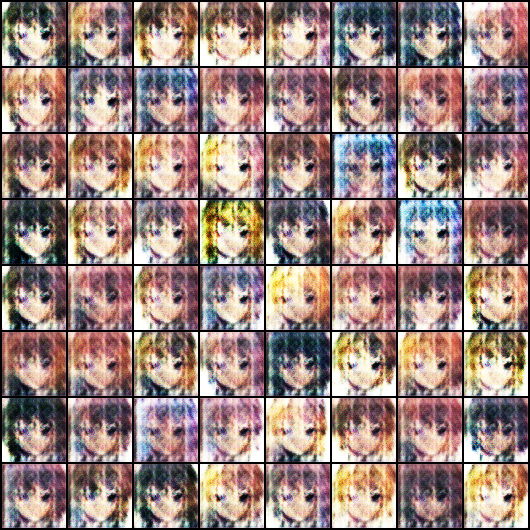

In [128]:
Image('./generated/generated-images-0001.png')

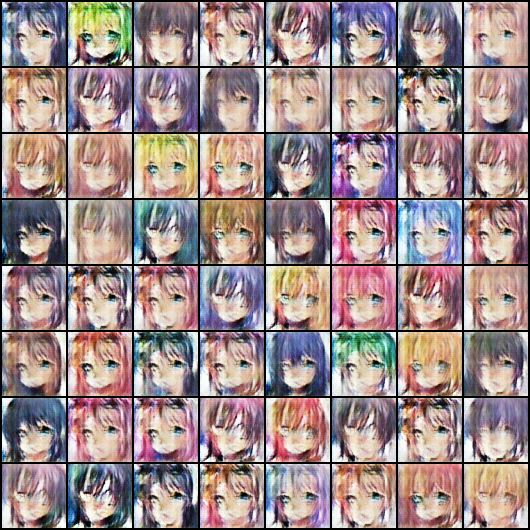

In [129]:
Image('./generated/generated-images-0010.png')

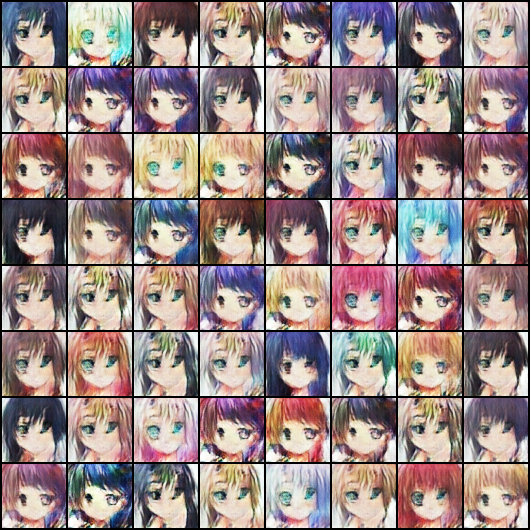

In [130]:
Image('./generated/generated-images-0015.png')

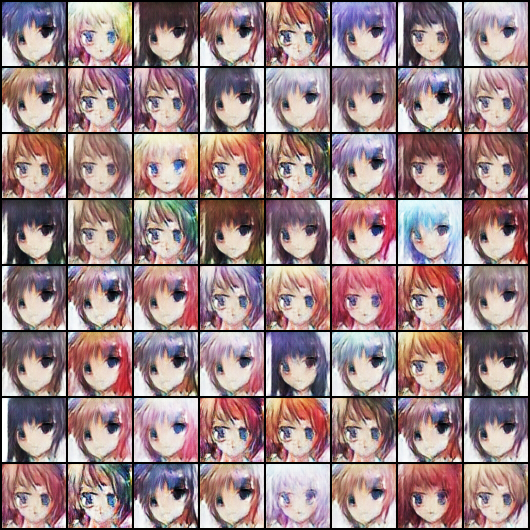

In [131]:
Image('./generated/generated-images-0020.png')

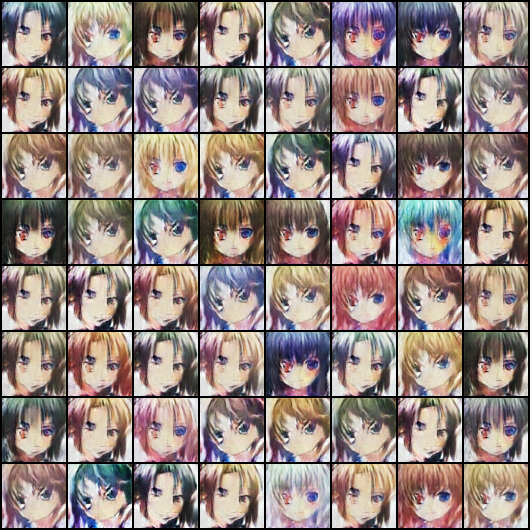

In [132]:
Image('./generated/generated-images-0025.png')